In [69]:
import mne
import os
import glob
import numpy as np
import pandas as pd
%matplotlib qt

In [70]:
DATA_DIR = "D:/naturehuman/EEG_raw"
OUTPUT_DIR = "D:/naturehuman/output"
EOG_CHANNELS = ['LO1', 'LO2', 'IO1', 'IO2']
EVENT_CHANNELS = {'stim': 'S 10', 'resp': 'S 20'}

In [71]:
vhdr_files = glob.glob(os.path.join(DATA_DIR, "**", "*.vhdr"), recursive=True)
vhdr_files

['D:/naturehuman/EEG_raw\\5005.vhdr',
 'D:/naturehuman/EEG_raw\\5007.vhdr',
 'D:/naturehuman/EEG_raw\\5008.vhdr',
 'D:/naturehuman/EEG_raw\\5009.vhdr',
 'D:/naturehuman/EEG_raw\\5010.vhdr',
 'D:/naturehuman/EEG_raw\\5011.vhdr',
 'D:/naturehuman/EEG_raw\\5012.vhdr',
 'D:/naturehuman/EEG_raw\\5014.vhdr',
 'D:/naturehuman/EEG_raw\\5018.vhdr',
 'D:/naturehuman/EEG_raw\\5019.vhdr',
 'D:/naturehuman/EEG_raw\\5020.vhdr',
 'D:/naturehuman/EEG_raw\\5021.vhdr',
 'D:/naturehuman/EEG_raw\\5022.vhdr',
 'D:/naturehuman/EEG_raw\\5023.vhdr',
 'D:/naturehuman/EEG_raw\\5024.vhdr',
 'D:/naturehuman/EEG_raw\\5025.vhdr',
 'D:/naturehuman/EEG_raw\\5026.vhdr',
 'D:/naturehuman/EEG_raw\\5027.vhdr',
 'D:/naturehuman/EEG_raw\\5028.vhdr',
 'D:/naturehuman/EEG_raw\\5029.vhdr',
 'D:/naturehuman/EEG_raw\\5030.vhdr',
 'D:/naturehuman/EEG_raw\\5031.vhdr',
 'D:/naturehuman/EEG_raw\\5032.vhdr',
 'D:/naturehuman/EEG_raw\\5033.vhdr',
 'D:/naturehuman/EEG_raw\\5034.vhdr',
 'D:/naturehuman/EEG_raw\\5035.vhdr',
 'D:/natureh

In [4]:
len(vhdr_files)

40

In [5]:
40*90

3600

In [72]:
file_path = vhdr_files[9]

In [73]:
subj_id = os.path.basename(file_path).split('.')[0]
subj_id

'5019'

# beh

In [74]:
behavior_data = pd.read_excel('D:/naturehuman/allSubDataTable.xls')
behavior_data

,SubNum,Version,Trial,CondType,Choice1,RTeval1,AvBid,MinBid,MaxBid,MaxvMinBid,...,NEO_FFI_Neurot_Total,IntolUncert_Short_ProspAnx,IntolUncert_Short_InhibAnx,IntolUncert_Short_Total,Blank,NFC_Total,accuracy,chosenvsunchosen,StimIDL,StimIDR
0,5005,501,1,2,2,1.301997,3.125,3.00,3.25,0.25,...,173,23,23,46,0,43,0,-0.25,BB_0084,AT_0123
1,5005,501,2,4,1,0.937665,9.750,9.75,9.75,0.00,...,173,23,23,46,0,43,1,0.00,RA_0022,AT_0162
2,5005,501,3,2,2,1.222055,0.500,0.50,0.50,0.00,...,173,23,23,46,0,43,1,0.00,RA_0082,RA_0015
3,5005,501,4,3,1,1.087200,6.000,6.00,6.00,0.00,...,173,23,23,46,0,43,1,0.00,RA_0085,BB_0095
4,5005,501,5,4,1,0.981394,8.250,8.25,8.25,0.00,...,173,23,23,46,0,43,1,0.00,RA_0024,AT_0155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4795,5050,501,116,4,1,1.727015,8.500,8.50,8.50,0.00,...,205,27,22,49,0,38,1,0.00,MM_0102,MM_0081
4796,5050,501,117,1,1,1.700104,8.500,8.00,9.00,1.00,...,205,27,22,49,0,38,0,-1.00,AT_0152,RA_0051
4797,5050,501,118,4,2,3.065892,9.500,9.50,9.50,0.00,...,205,27,22,49,0,38,1,0.00,MM_0039,MM_0071
4798,5050,501,119,1,1,1.353392,0.750,0.50,1.00,0.50,...,205,27,22,49,0,38,0,-0.50,RA_0021,BB_0046


In [96]:
behavior_data.shape

(4800, 43)

In [75]:
behavior_data_subj = behavior_data[behavior_data['SubNum'] == int(subj_id)]
behavior_data_subj

,SubNum,Version,Trial,CondType,Choice1,RTeval1,AvBid,MinBid,MaxBid,MaxvMinBid,...,NEO_FFI_Neurot_Total,IntolUncert_Short_ProspAnx,IntolUncert_Short_InhibAnx,IntolUncert_Short_Total,Blank,NFC_Total,accuracy,chosenvsunchosen,StimIDL,StimIDR
1080,5019,501,1,3,2,1.598546,6.375,6.25,6.50,0.25,...,168,26,13,39,0,89,1,0.25,BB_0149,AT_0178
1081,5019,501,2,1,2,1.238628,7.250,5.00,9.50,4.50,...,168,26,13,39,0,89,1,4.50,RA_0048,RA_0079
1082,5019,501,3,4,1,1.294395,9.750,9.75,9.75,0.00,...,168,26,13,39,0,89,1,0.00,BB_0076,AT_0174
1083,5019,501,4,1,1,1.805178,6.750,4.25,9.25,5.00,...,168,26,13,39,0,89,1,5.00,MM_0036,MM_0070
1084,5019,501,5,1,1,1.502121,6.125,6.00,6.25,0.25,...,168,26,13,39,0,89,0,-0.25,AT_0190,SS_0019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,5019,501,116,2,2,1.480160,0.250,0.25,0.25,0.00,...,168,26,13,39,0,89,1,0.00,BB_0080,MM_0038
1196,5019,501,117,1,2,1.070786,3.250,2.00,4.50,2.50,...,168,26,13,39,0,89,0,-2.50,BB_0067,BB_0107
1197,5019,501,118,2,1,1.382311,0.500,0.50,0.50,0.00,...,168,26,13,39,0,89,1,0.00,AT_0067,AT_0164
1198,5019,501,119,1,2,1.809205,1.500,0.50,2.50,2.00,...,168,26,13,39,0,89,0,-2.00,RA_0018,MM_0059


# load raw data

In [76]:
raw = mne.io.read_raw_brainvision(file_path, preload=True)
raw.set_channel_types({ch: 'eog' for ch in EOG_CHANNELS})
montage = mne.channels.make_standard_montage('standard_1005')
raw.set_montage(montage)

Extracting parameters from D:/naturehuman/EEG_raw\5019.vhdr...
Setting channel info structure...
Reading 0 ... 215499  =      0.000 ...   430.998 secs...


<RawBrainVision | 5019.eeg, 64 x 215500 (431.0 s), ~105.3 MiB, data loaded>

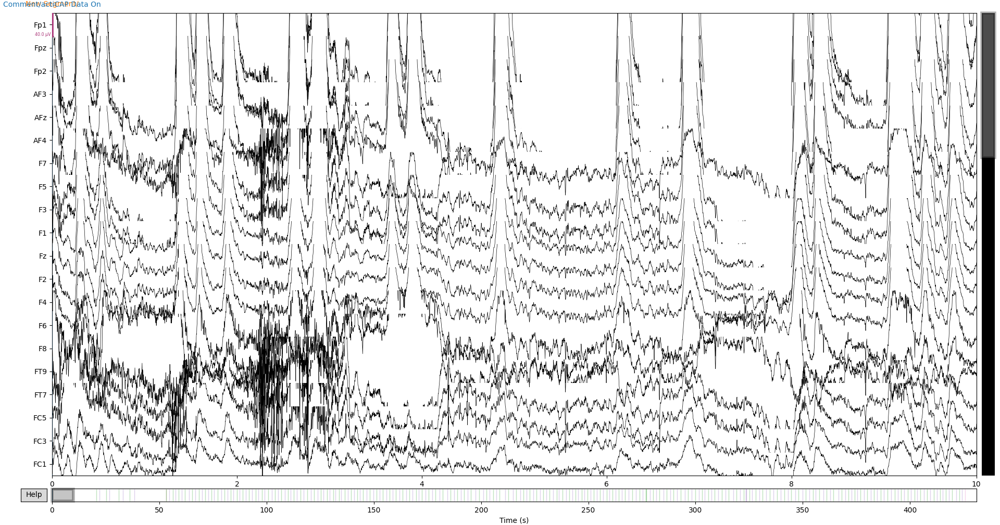

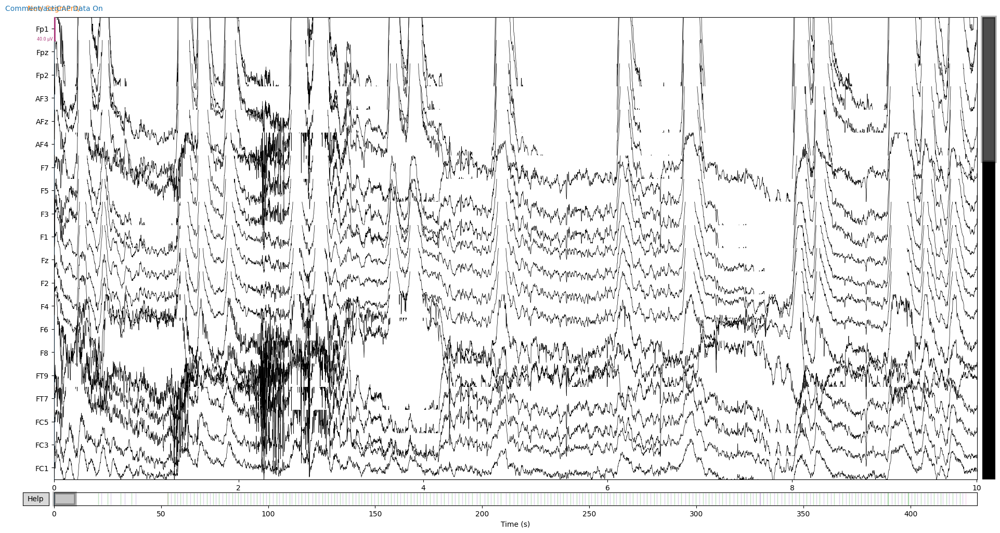

In [77]:
raw.plot()

In [78]:
raw.resample(sfreq=250)
raw

<RawBrainVision | 5019.eeg, 64 x 107750 (431.0 s), ~52.7 MiB, data loaded>

# preprocessing_single_file

In [79]:
raw.set_eeg_reference(ref_channels='average')

# 40Hz低通滤波
raw.filter(l_freq=0.5, h_freq=40, method='fir')

# ICA去眼电
ica = mne.preprocessing.ICA(n_components=30)
ica.fit(raw)
eog_indices, _ = ica.find_bads_eog(raw)
# ica.exclude = eog_indices
# ica.apply(raw)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.5 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.50
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 0.25 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 1651 samples (6.604 s)

Fitting ICA to data using 60 channels (please be patient, this may take a while)


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


Selecting by number: 30 components
Fitting ICA took 7.4s.
Using EOG channels: LO1, IO1, IO2, LO2
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- 

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 sam

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 sam

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 2500 sam

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.0s


In [80]:
ica.exclude = eog_indices

In [88]:
ica.exclude = [0, 1, 2, 3]

In [89]:
ica.apply(raw)

Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 4 ICA components
    Projecting back using 60 PCA components


<RawBrainVision | 5019.eeg, 64 x 107750 (431.0 s), ~52.7 MiB, data loaded>

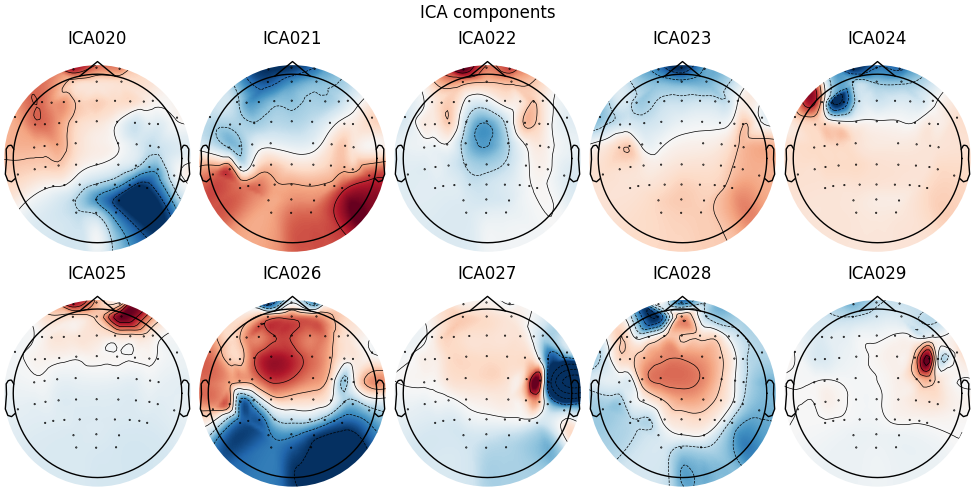

[<MNEFigure size 975x967 with 20 Axes>, <MNEFigure size 975x496 with 10 Axes>]

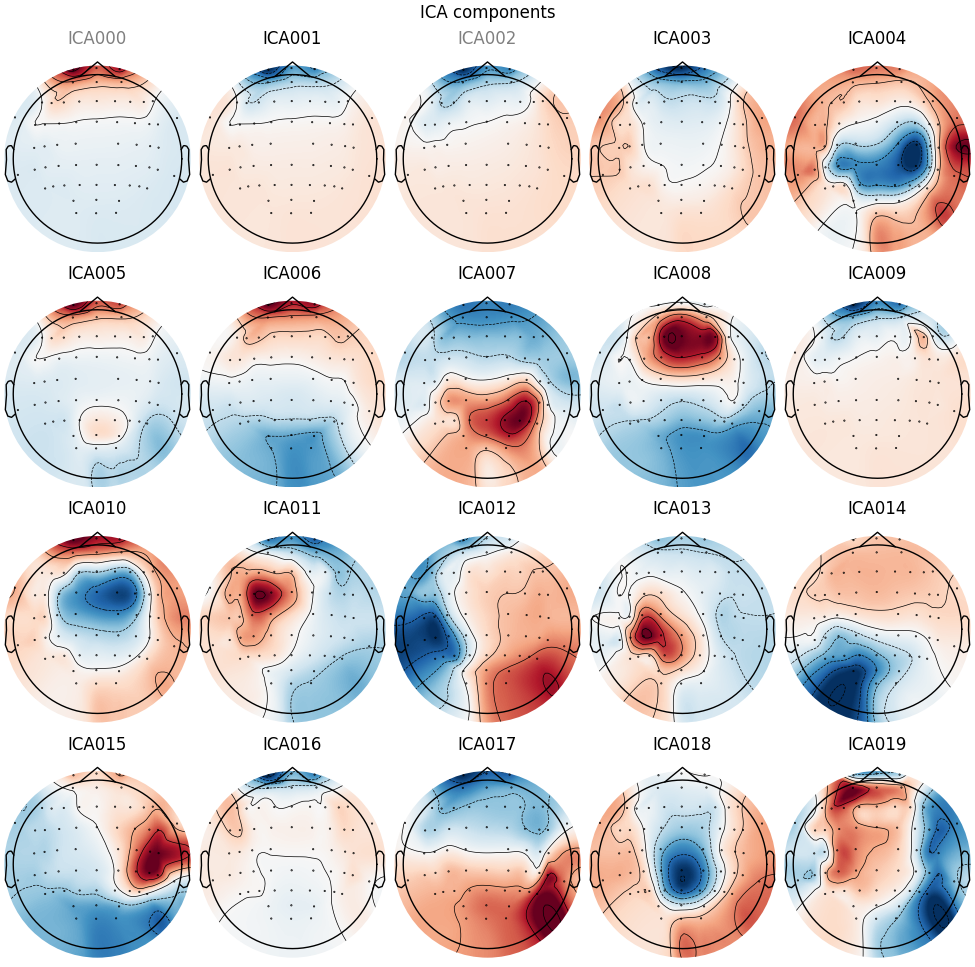

In [67]:
ica.plot_components()

Creating RawArray with float64 data, n_channels=34, n_times=107750
    Range : 0 ... 107749 =      0.000 ...   430.996 secs
Ready.


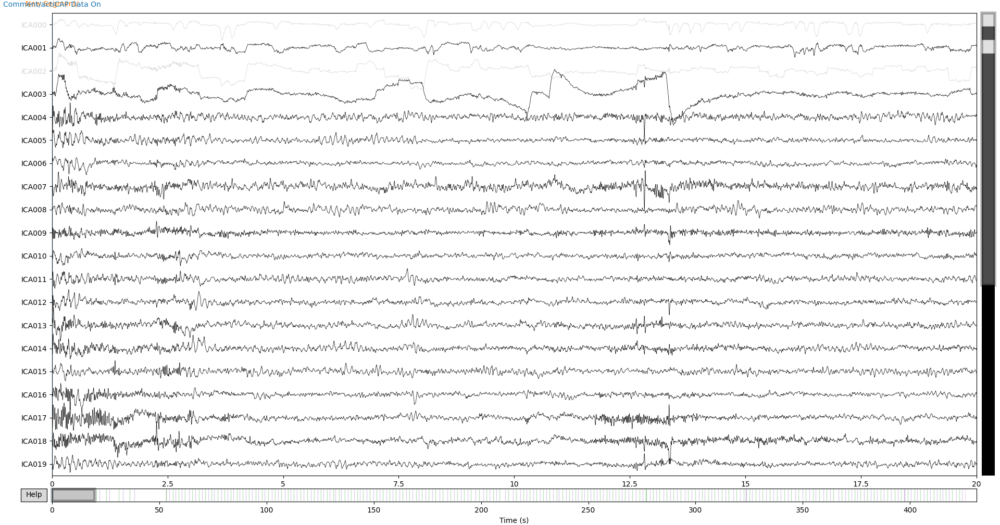

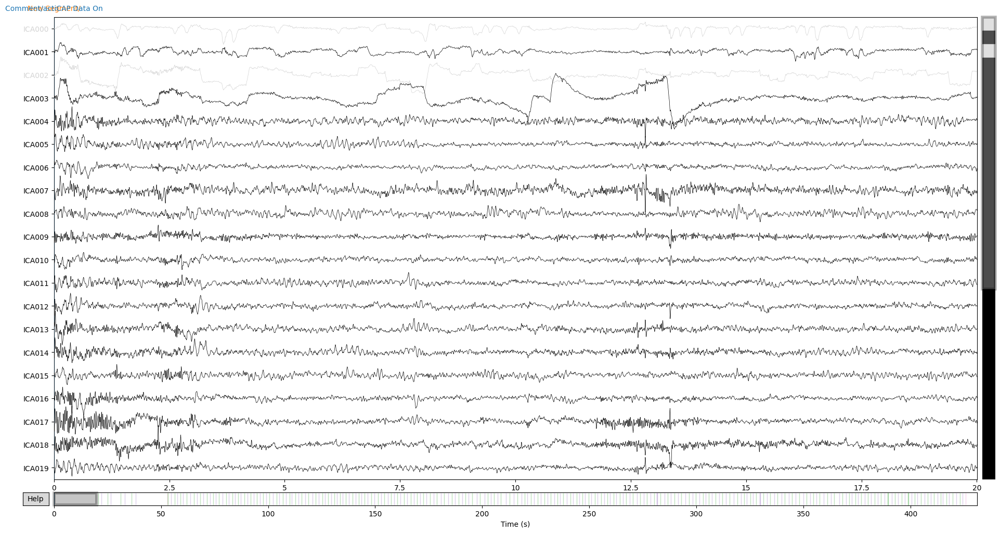

In [87]:
ica.plot_sources(raw)

In [82]:
eog_indices

[2, 0]

Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 2 ICA components
    Projecting back using 60 PCA components


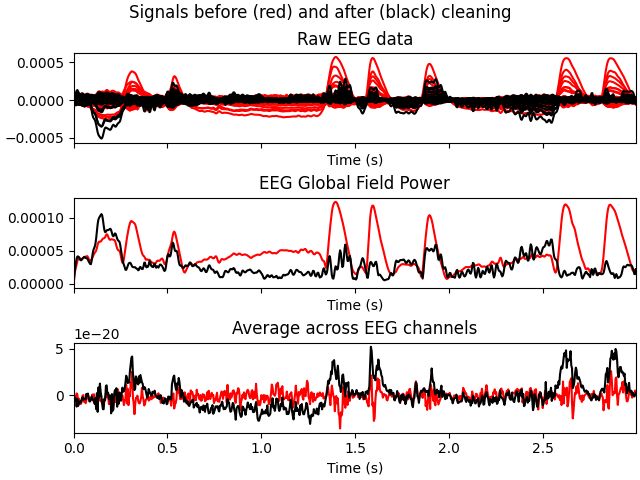

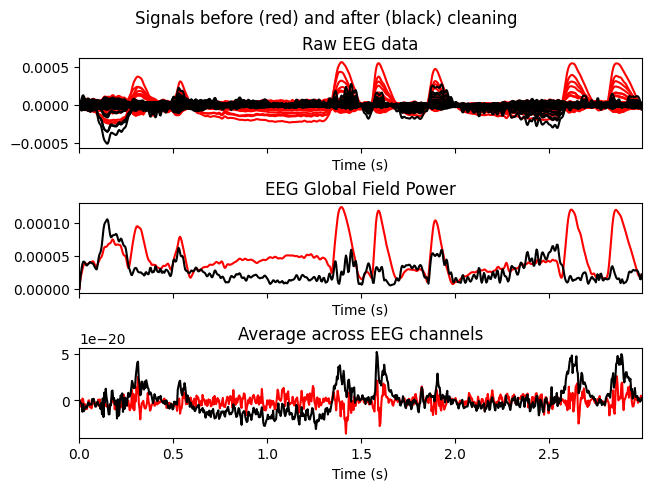

In [81]:
ica.plot_overlay(raw, exclude=eog_indices, picks='eeg')

Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 3 ICA components
    Projecting back using 60 PCA components


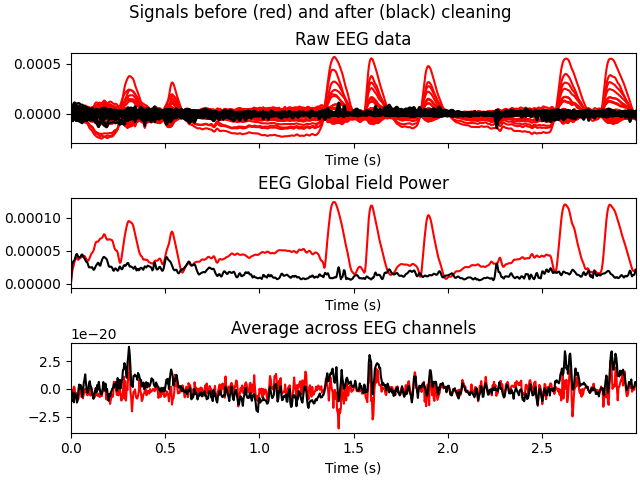

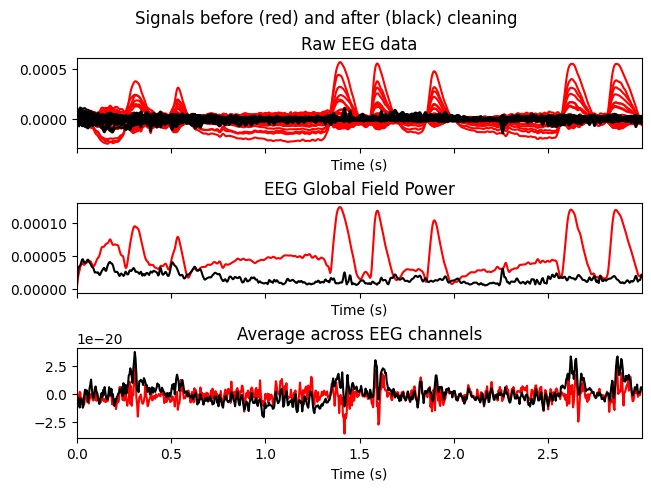

In [83]:
ica.plot_overlay(raw, exclude=[0, 1, 2], picks='eeg')

In [22]:
ica.exclude = [0, 1, 4]
ica.apply(raw)

Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 3 ICA components
    Projecting back using 60 PCA components


<RawBrainVision | 5039.eeg, 64 x 115230 (460.9 s), ~56.4 MiB, data loaded>

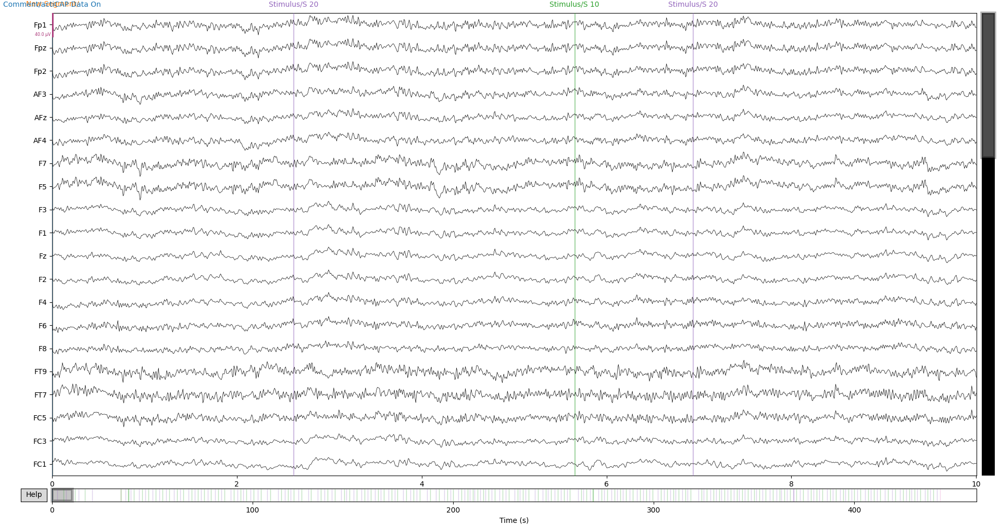

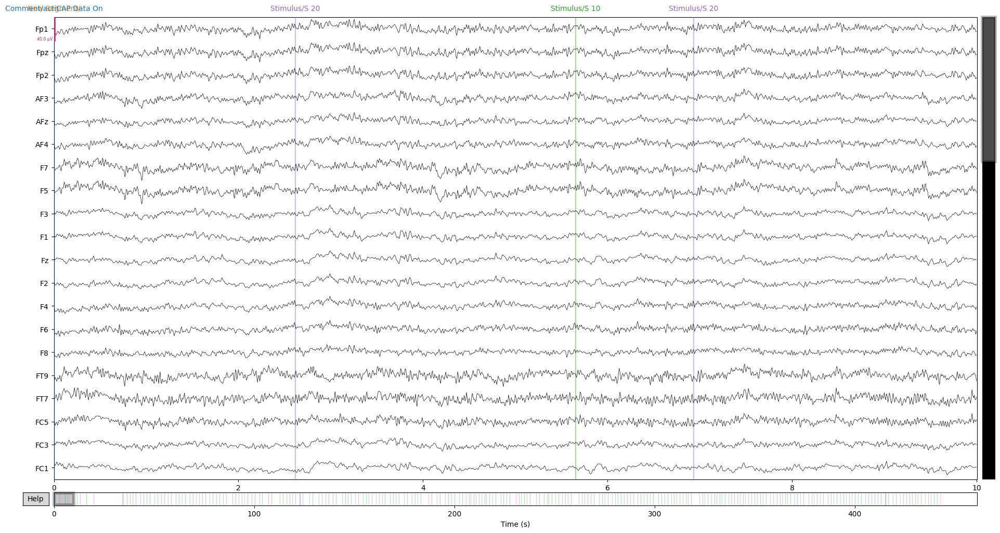

In [23]:
raw.plot()

# create epochs

In [97]:
events_stim = mne.events_from_annotations(raw, {'Stimulus/S 10': 10})

Used Annotations descriptions: ['Stimulus/S 10']


In [98]:
epo = mne.Epochs(raw, events_stim[0],
    tmin=-0.2,  # -200ms
    tmax=4.0,  # 4000ms like MATLAB code
    baseline=(-0.2, 0),
    # reject={'eeg': 150e-6},  # 150 µV like MATLAB
    preload=True)

Not setting metadata
124 matching events found
Applying baseline correction (mode: mean)
0 projection items activated
Using data from preloaded Raw for 124 events and 1051 original time points ...
0 bad epochs dropped


In [102]:
epo.get_data().shape[2]

1051

In [103]:
700/250

2.8

In [93]:
epo = epo[4:]

In [94]:
epo.metadata = behavior_data_subj

Adding metadata with 43 columns


In [95]:
epo.drop_bad(reject=dict(eeg=150e-6))

    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1', 'Fpz', 'Fp2']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1']
    Rejecting  epoch based on EEG : ['Fp1

<Epochs | 50 events (all good), -0.2 – 4 s (baseline -0.2 – 0 s), ~25.8 MiB, data loaded, with metadata,
 '10': 50>

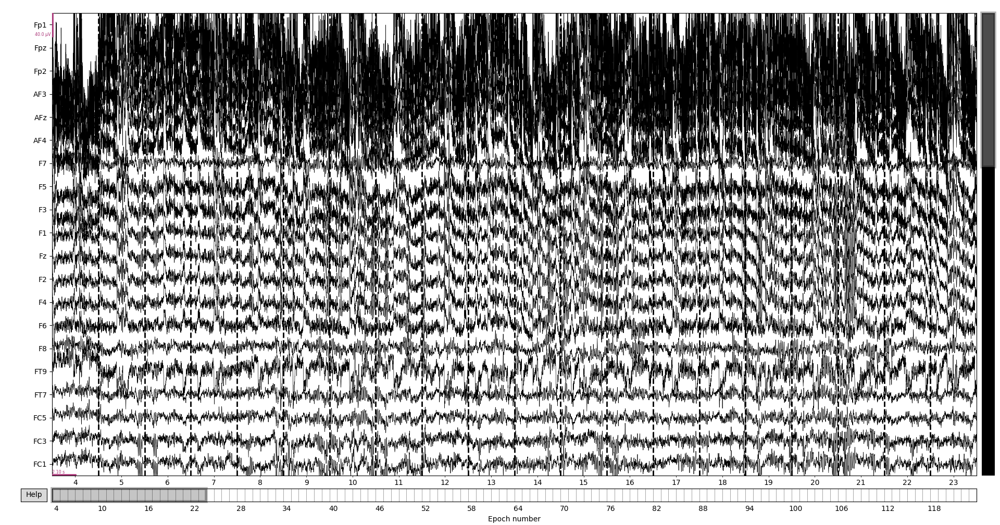

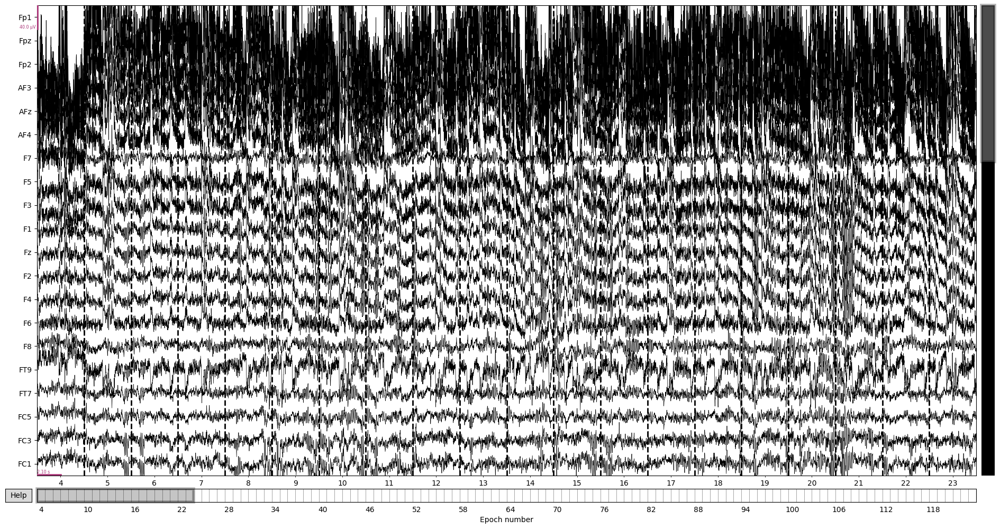

In [66]:
%matplotlib widget
epo.plot(show_scrollbars=True)

In [46]:
def detect_trends(data, window_size=100, max_slope=50e-6):
    grad = np.gradient(data, axis=-1)
    return np.any(np.abs(grad) > max_slope, axis=-1)

In [47]:
trend_mask_stim = detect_trends(epo.get_data())

In [48]:
trend_mask_stim.shape

(120, 64)

In [49]:
trend_mask_stim2 = np.any(trend_mask_stim, axis=1)
trend_mask_stim2

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True])

In [50]:
epo.drop(trend_mask_stim2, 'TREND')

Dropped 120 epochs: 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119


<Epochs | 0 events (all good), -0.2 – 4 s (baseline -0.2 – 0 s), ~93 KiB, data loaded, with metadata,
 '10': 0>

In [40]:
data = epo.get_data()
data.shape

(92, 64, 2101)

In [41]:
data2 = np.vstack([data, data])
data2.shape

(184, 64, 2101)

In [34]:
np.save('stest', data)

In [38]:
epo.metadata.to_csv('stest2')